## Credits
With some small exceptions, John wrote everything. Jared started importing the data, and John worked with Maria in building the models, but I (John) seriously spent like four days on this thing. Maria wrote some linear models that ended up not being used. 

# About running this file
This program will perform sampling on toy distributions if you let it, and these take a little time (~1min), and then never run again. Running this as an ipython notebook should not be especially taxing. **The notebook will not run full mcmc, and I ensured this.**

# BE/Bi 103, Fall 2018: Homework 9
## Due 1pm, December 11

(c) 2018 Justin Bois. With the exception of pasted graphics, where the source is noted, this work is licensed under a [Creative Commons Attribution License CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). All code contained herein is licensed under an [MIT license](https://opensource.org/licenses/MIT).

This document was prepared at [Caltech](http://www.caltech.edu) with financial support from the [Donna and Benjamin M. Rosen Bioengineering Center](http://rosen.caltech.edu).

## Problem 9.1: Caulobacter growth: exponential or linear, 80 pts

Remind yourself about [Homework 4.2](../hw4.html#Problem-4.2:-Caulobacter-growth,-60-pts), in which you computed the growth and division events of *Caulobacter crescentus* over time using date from [this paper](https://doi.org/10.1073/pnas.1403232111). In this problem, you will use your results from the image processing of those data sets to perform parameter estimation of the growth rates of the individual mother cells and also determine if bacterial growth on a single cell level is linear or exponential. You should use your own results form homework 4 for this problem, but in the event that you had trouble getting those results, you can use [these results](../data/hw_4.2_caulobacter_growth_image_processing_results.csv) from the HW4 solutions.

We know that under ideal conditions, bacterial cells experience exponential growth in bulk. That is, the number of cells grows exponentially. This is possible regardless of how individual cells growth; the repeated divisions lead to exponential growth. In their paper, the authors argue that the growth rate of *each* cell is also exponential.  I.e.,

\begin{align}
a(t) = a_0 \mathrm{e}^{k t},
\end{align}

where $a(t)$ is the area of the cell in the image as a function of time and $a_0$ is the area of the cell right after a division has been completed, which we mark as $t = 0$.

As an alternative model, the authors consider a linear growth model, in which

\begin{align}
a(t) = a_0 + b t.
\end{align}

An exponential curve is approximately linear (with $b = a_0k$) for short time scales.  So, it is often difficult to distinguish between a linear and an exponential growth. Your goal is to perform parameter estimates and do an effective comparison between these two models for growth. You should use hierarchical models, and be sure to take a principled approach in your model construction and evaluation.

Since you are using a hierarchical model, here are a few tips for building and implementing the models. You do not need to take this advice if you do not want to, but I have found that these strategies help.

1. Think carefully about your hyperpriors. If you choose an uninformative hyperprior for a level of the model that is data poor, you end up underpooling. For example, in this problem, there are only two mother cells. So, there are only two *Caulobacter* samples in your data set. If you put a broad prior on the growth rate of *Caulobacter* cells, these two cells can be effectively decoupled.
2. The hierarchical structure can make things difficult to code up and make it harder to hunt down bugs. As I'm building my hierarchical model, often approach it with "baby steps." I like to start off with a non-hierarchical model, often with a subset of the data. I perform sampling on this simpler model, taking a small number of samples so I do not have to wait for too long. After making sure everything is ok with this simpler structure, I then add a level to the hierarchy. I again do the sampling with a subset of the data, make sure everything works ok, and then add the next level of hierarchy, and so on. I find this helps me find bugs and little details along the way.
3. You will probably encounter the funnel of hell, so you should strongly consider using noncentered parametrizations.
4. When you sample out of the full hierarchical model, the sampler may be slower than you are used to seeing. It will likely also be much slower than sampling out of the non-hierarchical model, even though there are only a few more parameters. Stan may also be particularly slow during the warmup phase. You may see it progress taking a few seconds per iteration. This is natural.
5. Finally, just to give you a sense of what kind of computation time you might expect, for my hierarchical model, it took many hours to do the sampling on a c5.xlarge instance on AWS.


In [1]:
import numpy as np
import pandas as pd
import pystan
import sys

# Import Altair for high level plotting
import altair as alt
import altair_catplot as altcat

# Pevent bulky altair plots
alt.data_transformers.enable('json')

import bebi103
import bokeh
bokeh.io.output_notebook()

Loading BokehJS ...

# Data Wrangling

Let's load up the datasets from 4.2 and check their structure. 

In [2]:
# Data for bacteria 1
df_bac1 = pd.read_csv("./bac_1_areas.csv")
df_bac1 = df_bac1.drop(["Unnamed: 0"], axis = 1)

# Data for bacteria 2
df_bac2 = pd.read_csv("./bac_2_areas.csv")
df_bac2 = df_bac2.drop(["Unnamed: 0"], axis = 1)
df_bac1.head()

,label,area (sq µm)
0,0,976
1,1,552
2,2,551
3,3,568
4,4,554


We graph the area over time to get a sense of it.

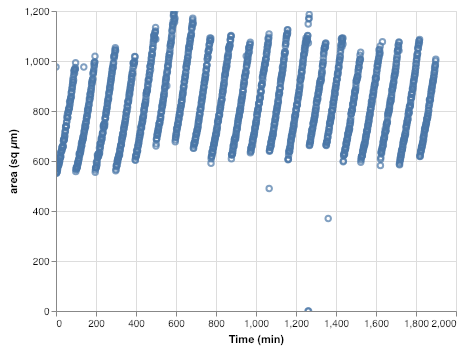

In [3]:
alt.Chart(df_bac1).mark_point().encode(
    x=alt.X('label', title = "Time (min)"),
    y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
).interactive()

And now for bacteria 2:

In [4]:
df_bac2.head()

,label,area (sq µm)
0,0,1046
1,1,435
2,2,606
3,3,610
4,4,632


And graph:

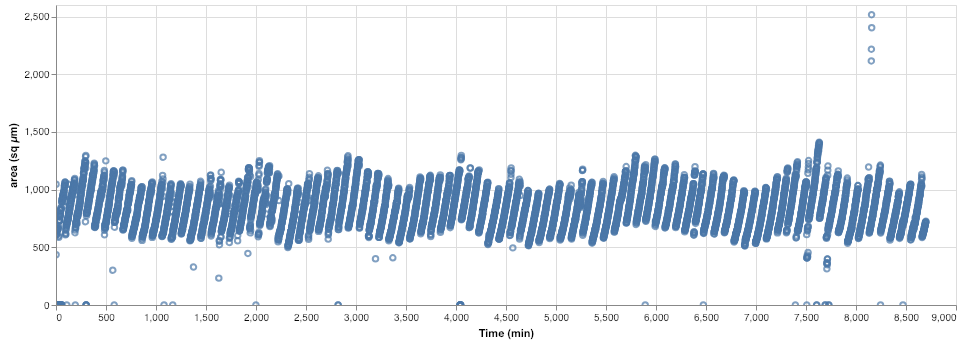

In [5]:
alt.Chart(df_bac2).mark_point().encode(
    x=alt.X('label', title = "Time (min)"),
    y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
).interactive().properties(height=300,
                           width=900)

Remove unphysical outliers:

In [6]:
df_bac1["isOutlier"] = ((df_bac1['area (sq µm)'] < 500) | # Drop low-area outliers
                        (df_bac1['area (sq µm)'] > 1500)) # Drop high-area outliers

df_bac2["isOutlier"] = ((df_bac2['area (sq µm)'] < 500) | # Drop low-area outliers
                        (df_bac2['area (sq µm)'] > 1500)) # Drop high-area outliers

bac1_thresh = df_bac1[df_bac1["isOutlier"] == False]
bac2_thresh = df_bac2[df_bac2["isOutlier"] == False]
bac1_thresh = bac1_thresh.drop(columns = ["isOutlier"])
bac2_thresh = bac2_thresh.drop(columns = ["isOutlier"])

Importing functions from 4.2

In [7]:
def find_divisions(df):
    """Returns an array that contains whether each point in a dataframe is a division or not."""
    # I will start by identifying the first division. 
    # We can see from the plots that this occurs in the first 30 frames. 
    areas = df['area (sq µm)'].values
    isDivision = np.zeros(len(df.index), dtype = bool)
    div_1 = np.argmin(areas[:30])
    isDivision[div_1] = True
    for i in range(30, len(df.index) - 30):
        region = np.zeros(61)
        for j in range(0, 61):
            region[j] = areas[i - 30 + j] # samples the 10 points on either 
                                         # side of the point of interest.
        if ((np.argmin(region) == 30) and region[30] < 780):
            isDivision[i] = True
    return isDivision

Create "isDivision" columns:

In [8]:
bac1_thresh.loc[:,"isDivision"] = find_divisions(bac1_thresh.copy())
bac2_thresh.loc[:,"isDivision"] = find_divisions(bac2_thresh.copy())

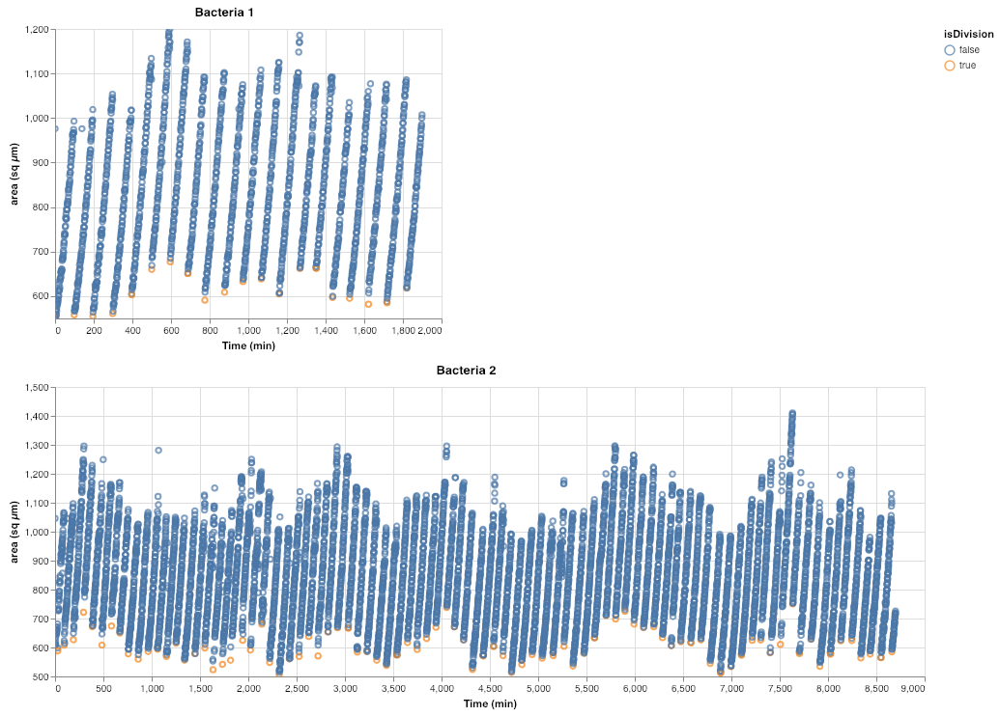

In [9]:
plot1 = alt.Chart(bac1_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = 'isDivision:N',
        ).interactive().properties(title = "Bacteria 1")

plot2 = alt.Chart(bac2_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = 'isDivision:N',
        ).interactive().properties(height=300,
                                   width=900,
                                   title = "Bacteria 2")

plot1 & plot2

I am curious how clean this data really is. I will try to color code the plot based on division number. 

In [10]:
def get_div_num(df):
    is_div = df["isDivision"].values
    div_num = np.zeros(len(is_div))
    for i in range(0, len(is_div)):
        div_num[i] = np.sum(is_div[:i + 1])
    return div_num
bac1_thresh.loc[:,"div_num"] = get_div_num(bac1_thresh.copy())
bac2_thresh.loc[:,"div_num"] = get_div_num(bac2_thresh.copy())

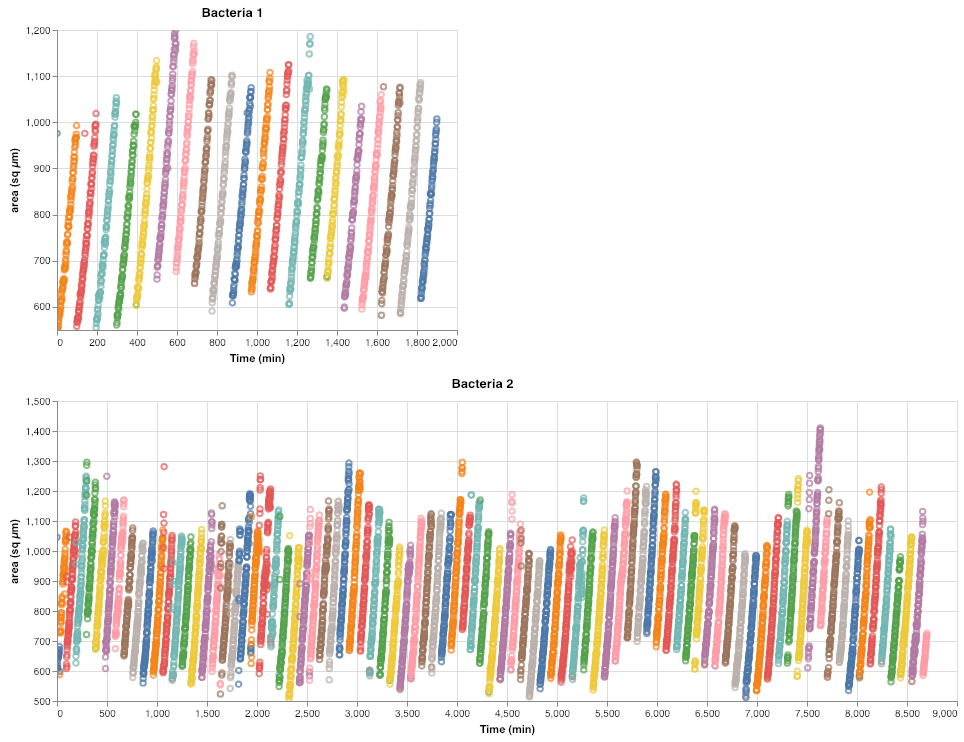

In [11]:
plot1 = alt.Chart(bac1_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = alt.Color('div_num:N',legend=None),
        ).interactive().properties(title = "Bacteria 1")

plot2 = alt.Chart(bac2_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = alt.Color('div_num:N',legend=None),
        ).interactive().properties(height=300,
                                   width=900,
                                   title = "Bacteria 2")
plot1 & plot2

The first bacterium's lineages look beautiful, but the first lineage is only two points, so I'll delete it. The first two lineages for the second bacteria look like one lineage; I'll trim some points off it and merge the lineages. 

In [12]:
# Remove lineage one for bac 1
bac1_thresh.loc[:,"div_num"] = bac1_thresh.copy()["div_num"].values - 1
bac1_thresh = bac1_thresh[bac1_thresh["div_num"] >= 0]

# Merge lineage and trim for bac 2
bac2_thresh = bac2_thresh[1:]
div_num = bac2_thresh["div_num"].values
for i in range(0, len(div_num)):
    if div_num[i] == 0:
        div_num[i] = 1
div_num = div_num - 1
bac2_thresh.loc[:,"div_num"] = div_num

/Users/john/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


The second bacterium's growth also looks good, with some errors near the cell divisions. We know we got the start correct, so this noise is probably because the image processing has trouble differentiating whether the cell has actually divided in the region about the division. These errors all occur above 950, so I'll just set any point near (but past) a division that is above that threshold to belong to the previous lineage. Furthermore, there are similar errors near the beginnings of divisions. If a point is in the last ten points in a lineage and is below 700, it should be in the next lineage. 

In [13]:
is_div = bac2_thresh["isDivision"].values
div_num = bac2_thresh["div_num"].values
areas = bac2_thresh['area (sq µm)'].values
for i in range(0, len(bac2_thresh.index)):
    if is_div[i] == True:
        for j in range(0, 30):
            if areas[j + i] > 950:
                div_num[j + i] = div_num[j + i] - 1
        if div_num[i] > 1:
            for j in range(-10, 0):
                if areas[j + i] < 700:
                    div_num[j + i] = div_num[j + i] + 1
bac2_thresh.loc[:,"div_num"] = div_num

We noticed a few glaring errors and removed them. 

In [14]:
# Manually delete errors in image segmentation
bac1_thresh = bac1_thresh.drop([139, 1632])

Let's re-make the plot and see if we solved the problems!

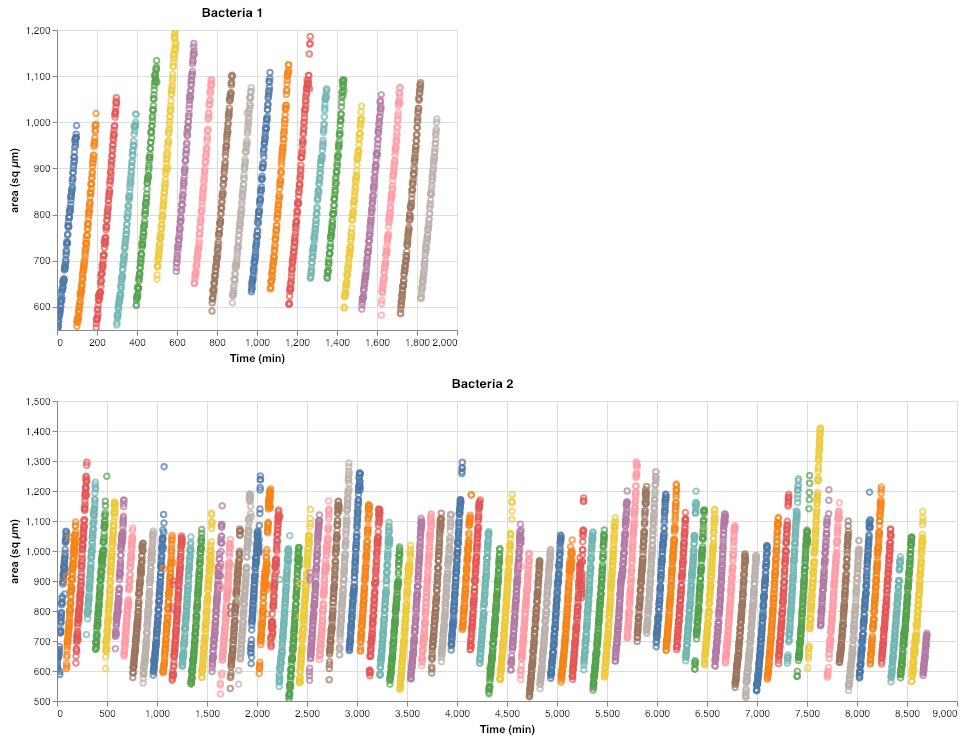

In [15]:
plot1 = alt.Chart(bac1_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = alt.Color('div_num:N',legend=None),
            tooltip = ["label", "isDivision", 'area (sq µm)']
        ).interactive().properties(title = "Bacteria 1")

plot2 = alt.Chart(bac2_thresh).mark_point().encode(
            x=alt.X('label', title = "Time (min)"),
            y=alt.Y('area (sq µm)', scale=alt.Scale(zero=False)),
            color = alt.Color('div_num:N',legend=None),
            tooltip = ["label", "isDivision", 'area (sq µm)', 'div_num']
        ).interactive().properties(height=300,
                                   width=900,
                                   title = "Bacteria 2")
plot1 & plot2

Yay! Now the data looks ready for modeling! The format we want in order to send this into Stan is a little tricky. Stan only wants arrays of a fixed length, so we will need separate arrays that specify:
1. The cell area
2. The time the cell has been growing in minutes since the last division
3. The cell
4. The division number for that cell

Each of these arrays must be the length of our entire data set. I will set about making these from the above data. 

In [16]:
bac1_thresh.loc[:,"bac_id"] = np.zeros(len(bac1_thresh.index))
bac2_thresh.loc[:,"bac_id"] = np.ones(len(bac2_thresh.index))
# Concatenate this into a single dataframe
data = pd.concat([bac1_thresh, bac2_thresh])
data = data.rename(columns = {"label":"time (min)"})
data = data.drop(columns = ["isDivision"])

/Users/john/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)


The time column is currently a disaster. We need to isolate each series and then subtract the start time of the series from all time points in the series. I will write a function to find the min, and then calculate the min for every point in the dataframe. This is a slow way to do this, but it's easy to think about and possible since we don't have hundreds of thousands of data points. 

In [17]:
def find_min_time(data, index):
    """Finds the min time in the dataframe data for the series 
    associated with the entry at index 'index'. """
    bac_num = data["bac_id"].values[index]
    div_num = data["div_num"].values[index]
    series = data[data["bac_id"]==bac_num]
    series = series[series["div_num"]==div_num]
    series_times = series["time (min)"].values
    return np.min(series_times)
times = data["time (min)"].values
new_times = np.zeros(len(data.index))
for i in range(0, len(new_times)):
    new_times[i] = times[i] - find_min_time(data.copy(), i)
data["time (min)"] = new_times

Let's sanity-check the non-trivial operation that I just did by making a few plots. 

In [18]:
plots = [0]*4
# Series to plot were chosen arbitrarily
for i in range(0, 4):
    data_plot = data[data["bac_id"] == (i % 2)]
    data_plot = data_plot[data_plot["div_num"] == i * 2 + 1]
    time = data_plot["time (min)"].values
    area = data_plot['area (sq µm)'].values
    p = bokeh.plotting.Figure(height=300, width=200, 
                              title = "Bacteria %i Division %i" % (i % 2, i * 2 + 1),
                              x_axis_label = "time (min)",
                              y_axis_label = "cell area (sq µm)")
    p.circle(time, area)
    plots[i] = p
bokeh.io.show(bokeh.layouts.row(plots))
data.head()

,time (min),area (sq µm),div_num,bac_id
2,0.0,551,0.0,0.0
3,1.0,568,0.0,0.0
4,2.0,554,0.0,0.0
5,3.0,559,0.0,0.0
6,4.0,558,0.0,0.0


Yay!! All our data is plotted on a time axis that makes intuitive sense! The last wrangling I want to do is to make the division number more informative. It would be best if it were unique across the entire dataframe, and also if it started at one. This way, it can be used for indexing in stan. 

In [19]:
# I'll make bac_id 1 and 2 for stan indexing also
data.loc[:,"bac_id"] = data["bac_id"].values + 1
# make div_num unique

bac_id = data["bac_id"].values
max_div_num = np.max(data[data["bac_id"]==1]["div_num"].values)
div_num = data["div_num"].values
for i in range(0, len(div_num)):
    if bac_id[i] == 2:
        div_num[i] = div_num[i] + max_div_num + 1
div_num = div_num + 1
data.loc[:,"div_num"] = div_num
data.head()

,time (min),area (sq µm),div_num,bac_id
2,0.0,551,1.0,1.0
3,1.0,568,1.0,1.0
4,2.0,554,1.0,1.0
5,3.0,559,1.0,1.0
6,4.0,558,1.0,1.0


This dataframe is valuable, and I want to be able to access it from external python files, which will be able to run MCMC faster than a jupyter kernel. I'll save it to a CSV, and then reload it for consistency. 

In [20]:
data.to_csv("./9.1_data_wrangled.csv")

Our dataframe is in a format such that stan will be able to interpret the columns. We may now focus on the stan model!

# Deriving the Hierarchical Stan Models
## Exponential Model

Our hierarchical model will have 3 layers:
0. Parameters that describe general cell growth.
1. Parameters that describe the growth of each cell.
2. Parameters that describe each growing period of a paricular cell. 

I will first focus on the exponential model, which states:
$$\text{Cell mass ~ Cell Area } = a_0e^{kt}$$

The image processing gave us error that can be erratic, so error at the lower levels of the model would probaby not be best modeled as guassian. The Student-t distribution is a better choice in this case, and we will parametrize the distribution differently for each cell. Using this model and plugging in the exponential as the peak of the Student-t, our model predicts:
$$\text{Cell Area ~ student_t}(\nu_{2,i}, (a_0)_{2, n, i}e^{k_{2, n, i}t}, \sigma_{2,i})$$

where subscripts are of the form: $\nu_{\text{model layer}, \text{ cell number}}$ and $(a_0)_{\text{model layer}, \text{ growth event}, \text{ cell number}}$ ($n$ is growth event, $i$ is cell number).
We can immeditely come up with priors on $\nu$ and $\sigma$. The heaviness of the tails can vary a lot, so I'll choose a broad prior on $\nu$, 
$$ \nu_{2, i} \sim 1 + 10 * \text{lognormal}(0.1, 1.0)$$
The measurement error might vary by about 20 µm$^2$, so I'll make sigma half-normal with a standard deviation of 20. 
$$ \sigma_{2, i} \sim 20 * \text{halfnormal}(0, 1)$$

<p style="background-color:#D9EDF7">
    The choice of standard deviation is reasonable for your data, but the area values are not in units of square microns.  (Typical bacterial sizes are around 1 square micron.)<br>
</p>

The rest of the hierarchy will be less complicated. The parameters for the individual growth events will be drawn from the distributions above in the following way:

$a_0$ from the bottom layer is found from the $a_0$ above it, with some deviation:

\begin{align}
(a_0)_{2, n, i} \sim & \, \text{norm}((a_0)_{1, i}, \sigma_{a, 1, i})\\
\sigma_{a, 1, i} \sim & \, 50 * \text{halfnorm}(0, 1)
\end{align}

$k$ is similar. 

\begin{align}
k_{2, n, i} \sim & \, k_{1, i} + \sigma_{k, 1, i} * \text{norm}(0, 1)\\
\sigma_{k, 1, i} \sim & \, 0.0005 * \text{halfnorm(0, 1)}
\end{align}

We repeat this process to derive the mid-layer hyperparameters. 

\begin{align}
(a_0)_{1, i} \sim & \,(a_0)_{0} + \sigma_{a, 0} * \text{norm}(0, 1)\\
\sigma_{a, 0} \sim & \, 50 * \text{halfnorm}(0, 1)\\
k_{1, i} \sim & \, k_{0} + \sigma_{k, 0} * \text{norm}(0, 1)\\
\sigma_{k, 0} \sim & \, 0.002 * \text{halfnorm(0, 1)}
\end{align}

Finally, we use simple positive priors for the hyperparameters. Note that log-normal was chosen for $k$ because it must be positive but may be small, and $a_0$ was chosen by approximating the initial cell area as around 600 µm$^2$.

\begin{align}
k_{0} \sim & \, \text{lognorm}(-4.5, 0.3)\\
(a_0)_0 \sim & \, \text{norm(600, 75)}
\end{align}

<p style="background-color:#D9EDF7">
    Excellent work thinking carefully about the underlying generative model, differentiating the measurement/analysis error as potentially more variable than the biological differences.<br>
</p>

## Linear model
The linear model will be the same as the exponential model, with some small changes that will be explored later.

# Prior Predictive Check

## Exponential model

First, I will compile and print out the model:

In [21]:
ppc_exp = bebi103.stan.StanModel(file='./9.1_prior_pred_exp.stan')
print(ppc_exp.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
}

generated quantities
{
    // PPC output
    vector[N] areas; // cell area over time
    vector[N] model_pred; // expected value for cell area

    // bottom layer parameters
    vector<lower=0>[num_divisions] a0_2; // bottom layer growth coefficient 
    vector<lower=0>[num_divisions] k_2;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2; // variation in area measurement (unique per cell)
    vector<lower=1>[num_cells] nu_2;  // tail-weight in area measurement (unique per cell)

    // mid-layer parameters
    vector<lower=0>[num_cells]

I will be running sampling code externally in python, so I'm reloading the dataframe to be consistent with external python files I will write. 

In [22]:
data = pd.read_csv("./9.1_data_wrangled.csv")
data = data.drop(columns = ["Unnamed: 0"])
data.head()

,time (min),area (sq µm),div_num,bac_id
0,0.0,551,1.0,1.0
1,1.0,568,1.0,1.0
2,2.0,554,1.0,1.0
3,3.0,559,1.0,1.0
4,4.0,558,1.0,1.0


I need to do one last bit of wrangling in order to synthesize the arrays that stan needs. This is mostly just getting the bacteria number as an array in terms of the division occuring. 

In [23]:
# let's just see how many divisions we have in total. 
# We will need to feed this parameter into stan
N = len(div_num)
num_divisions = len(np.unique(div_num))

# I need to make an array that specifies the bacterium for each division
unique_div_nums = np.unique(div_num)
bac_id_per_div_num = np.zeros(len(unique_div_nums))
for i in range(0, len(unique_div_nums)):
    div = unique_div_nums[i]
    sub_df = data[data["div_num"]==div]
    bac_id_per_div_num[i] = sub_df.iloc[0]["bac_id"]
print("Bacteria ID for each division number:")
print(bac_id_per_div_num)

Bacteria ID for each division number:
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]


Now I will set up the input dictionary, which will be simple given the previous data wrangling, and then perform sampling for the prior predictive check. 

In [24]:
df_ppc_exp = None
ppc_exp_samples = None
try:
    df_ppc_exp= pd.read_csv("./9.1_ppc_exp.csv")
    df_ppc_exp = df_ppc_exp.drop(columns = ["Unnamed: 0"])
except FileNotFoundError:
    ppc_dict = {"N":N,
            "num_divisions": num_divisions,
            "num_cells": 2,
            "div_num": data["div_num"].values.astype(int),
            "bac_id_per_div_num": bac_id_per_div_num.astype(int),
            "bac_id": data["bac_id"].values.astype(int),
            "time": data["time (min)"].values}

    ppc_exp_samples = ppc_exp.sampling(data=ppc_dict,
                                   algorithm='Fixed_param',
                                   warmup=0,
                                   chains=1,
                                   iter=200)
    df_ppc_exp = bebi103.stan.to_dataframe(ppc_exp_samples, inc_warmup = False, diagnostics=False)
    df_ppc_exp.to_csv("./9.1_ppc_exp.csv")
df_ppc_exp.head()

,chain,chain_idx,warmup,areas[1],areas[2],areas[3],areas[4],areas[5],areas[6],areas[7],...,sigma_a_1[2],k_1[1],k_1[2],sigma_k_1[1],sigma_k_1[2],a0,k,sigma_a_0,sigma_k_0,lp__
0,1,1,0,533.822034,544.859851,523.831142,542.080307,533.373949,551.587108,583.063057,...,55.442925,0.009784,0.010186,0.000636,0.000156,515.253911,0.009473,3.457623,0.001195,0.0
1,1,2,0,451.692081,456.370489,459.243695,462.205848,473.807425,467.425185,475.549345,...,68.868293,0.010700,0.013221,0.000262,0.000767,603.795792,0.011025,82.140251,0.001672,0.0
2,1,3,0,683.262274,600.084829,695.122857,625.761427,698.180649,707.076342,685.787450,...,39.259952,0.008826,0.008830,0.000199,0.000361,634.074972,0.009309,22.285330,0.000641,0.0
3,1,4,0,664.543928,694.272219,642.707185,804.913045,803.547916,740.109835,705.250198,...,50.273996,0.005666,0.007937,0.000226,0.000304,633.164061,0.008756,36.799874,0.002416,0.0
4,1,5,0,592.674528,638.907717,520.742590,604.165082,636.428476,598.748612,600.278718,...,107.305726,0.007189,0.005626,0.000842,0.000224,541.076314,0.006994,8.359190,0.001105,0.0


Sampling worked! Let's first do a sanity check and see whether we are getting valid data. 

In [25]:
print("There are %i NaN values out of %i total."
      %(len(df_ppc_exp) - len(df_ppc_exp.dropna()), len(df_ppc_exp)))

There are 1 NaN values out of 200 total.


This is not fantastic, but is a relatively small amount of error, and we decided to forgive it rather than further constrain the model. 

Now I will make some plots. I will start by plotting all possible versions of the first bacterial division, where each line has an entirely new set of hyperparameters. 

In [26]:
# I will start by plotting the first series
num_pts = len(data[data["div_num"]==1]["div_num"].values)
df_ppc_exp_plot = df_ppc_exp.dropna()
df_ppc_exp_plot = df_ppc_exp_plot[["areas[%i]"%i for i in range(1, num_pts + 1)]]
time = data[data["div_num"]==1]["time (min)"].values
p = bokeh.plotting.Figure(height = 500, 
                          width = 600, 
                          title = "Series 1 Prior Predicitve Check",
                          y_range = [300, 1500],
                          x_axis_label = "time (min)",
                          y_axis_label = "Cell area")
for i in range(0, len(df_ppc_exp_plot.index)):
    p.line(time, df_ppc_exp_plot.iloc[i].values, line_width = 0.2)
bokeh.io.show(p)

This looks great! There is a lot of diversity in this model, both in the characteristic error of the lines and the shape of the growth. Now suppose we keep the hyperparameters constant, and plot all the growth curves for a single sample:

In [27]:
colors = ['red', 'blue']
df_ppc_exp_plot = df_ppc_exp.dropna()
plots = [0]*3
for j in range(0, 3):
    plots[j] = bokeh.plotting.Figure(height = 350, 
                                  width = 300, 
                                  title = "Sample %i Prior Predicitve Check" %(j+1),
                                  y_range = [300, 1500],
                                  x_axis_label = "time (min)",
                                  y_axis_label = "Cell area")
    divs = np.unique(data["div_num"].values).astype(int)
    for i in divs:
        time = data[data["div_num"]==i + 1]["time (min)"].values
        indices = data[data["div_num"]==i + 1].index.values + 1
        values = df_ppc_exp_plot[["areas[%i]"%i for i in indices]].iloc[j].values
        plots[j].line(time, values, line_width = 0.2, 
                      # I'm going to color by cell
                      color = colors[(bac_id_per_div_num[i - 1]-1).astype(int)])

bokeh.io.show(bokeh.layouts.row(plots))

This is awesome! We can see that our generative model allows for substantial differences between cells, but still provides physical results. The distribution within the same cell appears to be much more well defined that the total distribution seen in the series 1 PPC. 

# MCMC Sampling
## Exponential Model: A Toy Problem

In [28]:
mcmc_exp = bebi103.stan.StanModel(file='./9.1_mcmc_exp.stan')
print(mcmc_exp.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
    real areas[N]; // Cell area over time
}

parameters
{
    // top-layer hyperparameters
    real<lower=0> a0;
    real<lower=0> k;
    real<lower=0> sigma_a_0;
    real<lower=0> sigma_k_0_tilde;

    // bottom layer parameters
    vector<lower=0>[num_divisions] a0_2_tilde; // bottom layer growth coefficient 
    vector<lower=0>[num_divisions] k_2_tilde;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2; // variation in area measurement (unique per cell)
    vector<lower=0>[num_cells] nu_2_tilde;  // tail-weight in area measurement (unique

**I'm going to be honest here, this model scares me a little.**

I will start by running the model on a toy data set to get a rough performance estimate; I will choose two series, one from each cell, and fit them.

In [29]:
# I want to take random divsions. I chose 2 and 41, one from each cell
toy_data = pd.concat([data[data["div_num"]==2], data[data["div_num"]==41]])
# I need the division number to be [1, 2], and this can be changed with quick arithmetic. 
toy_data.loc[:,"div_num"] = (toy_data.copy()["div_num"].values % 2) + 1
toy_data.head()

,time (min),area (sq µm),div_num,bac_id
97,0.0,558,1.0,1.0
98,1.0,568,1.0,1.0
99,2.0,566,1.0,1.0
100,3.0,575,1.0,1.0
101,4.0,574,1.0,1.0


In [30]:
# I actually ran this externally in the file "9.1_mcmc_toy_exp.py"
df_toy_exp = None
toy_samples_exp = None
try:
    df_toy_exp= pd.read_csv("./9.1_toy_mcmc_exp.csv")
    df_toy_exp = df_toy_exp.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    toy_exp_dict = {"N":len(toy_data.index),
                    "num_divisions": 2,
                    "num_cells": 2,
                    "div_num": toy_data["div_num"].values.astype(int),
                    "bac_id_per_div_num": [1,2],
                    "bac_id": toy_data["bac_id"].values.astype(int),
                    "time": toy_data["time (min)"].values,
                    "areas": toy_data['area (sq µm)'].values}
    toy_samples_exp = mcmc_exp.sampling(data=toy_exp_dict, 
                                        control=dict(adapt_delta = .98,
                                                     max_treedepth = 13),
                                        warmup=2000, 
                                        iter=6000, 
                                        thin=1)
   
    df_toy_exp = bebi103.stan.to_dataframe(toy_samples_exp, inc_warmup = False, diagnostics=False)
    df_toy_exp.to_csv("./9.1_toy_mcmc_exp.csv")
    
    # Check mcmc results
    orig_stdout = sys.stdout
    f = open('./9.1_mcmc_toy_exp_log.txt', 'a')
    sys.stdout = f
    bebi103.stan.check_all_diagnostics(toy_samples_exp)
    sys.stdout = orig_stdout
    f.close()
    
df_toy_exp.head()

,chain,chain_idx,warmup,a0,k,sigma_a_0,sigma_k_0_tilde,a0_2_tilde[1],a0_2_tilde[2],k_2_tilde[1],...,areas_ppc[179],areas_ppc[180],areas_ppc[181],areas_ppc[182],areas_ppc[183],areas_ppc[184],areas_ppc[185],areas_ppc[186],areas_ppc[187],lp__
0,1,1,0,513.618601,0.005396,7.440216,0.262350,0.722160,2.384526,0.830969,...,1116.461497,1160.206295,1225.932748,1207.671037,1225.218055,1229.321918,1240.563323,1232.275231,1216.084980,-661.687137
1,1,2,0,528.405466,0.005263,64.533720,0.106062,0.884648,0.386994,1.040924,...,1144.591281,1245.292646,1207.780218,1207.848047,1206.842098,1248.684010,1226.458355,1246.451331,1235.376920,-665.738984
2,1,3,0,528.661146,0.005181,73.238027,0.198631,0.648555,1.006437,1.379272,...,1132.030968,1187.471958,1193.678983,1187.902389,1220.456075,1202.967769,1173.928145,1317.137618,1223.782106,-663.411672
3,1,4,0,529.293700,0.005198,60.843969,0.237244,0.777213,1.199464,1.422590,...,1139.481712,1178.526021,1189.608463,1210.014189,1214.159774,1232.569524,1225.062276,1298.400357,1215.079768,-661.005441
4,1,5,0,528.199504,0.005476,9.138117,0.249401,0.488923,1.994580,1.307650,...,1159.812850,1154.873064,1172.413064,1209.182008,1206.570852,1219.088298,1280.598870,1258.010235,1211.758769,-664.611453


In [31]:
!head -10 ./9.1_mcmc_toy_exp_log.txt

Log file for Exponential MCMC
John Heath
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
10 of 16000 (0.0625%) iterations ended with a divergence.
  Try running with larger adapt_delta to remove divergences.
0 of 16000 (0.0%) iterations saturated the maximum tree depth of 13.
E-BFMI indicated no pathological behavior.


Let's check what the posteior looks like next to our data on these series!

In [32]:
plots = [0]*2
s = [2, 41]
indices = [0]*2
indices[0] = range(1, len(data[data["div_num"]==s[0]].index) + 1)
indices[1] = range(len(data[data["div_num"]==s[0]].index), len(toy_data.index))
for j in range(0, 2):
    plots[j] = bokeh.plotting.Figure(height = 450, 
                                     width = 400, 
                                     title = "Sample %i Posterior Predicitve Check" %(s[j]),
                                     y_range = [300, 1500],
                                     x_axis_label = "time (min)",
                                     y_axis_label = "Cell area")
    
    time = data[data["div_num"]==s[j]]["time (min)"].values
    
    
    for i in range(3000, 3100): 
        values = df_toy_exp[["areas_ppc[%i]"%k for k in indices[j]]].iloc[i].values
        plots[j].line(time, values, line_width = 0.1, color = 'blue')
    values = data[data["div_num"]==s[j]]["area (sq µm)"].values
    plots[j].line(time, values, line_width = 2, color = 'red')
bokeh.io.show(bokeh.layouts.row(plots))

This seems to me like a pretty reasonable approximation of our data, but is a little error-prone. There is a lot of variability in Sample 41, but this makes sense given that sample 41 is a noisy sample anyways. Sample 2 is better behaved, and this is clear from the posterior. Note that the model is behaving like this because it assumes these samples are from completely different cells, and thus have very different parameters. In the full model, if cell 2 has growth phases that are better-behaved, the variance in sample 41 might be toned down. 

## Exponential model: The Real Thing

Let's run the full thing!

In [33]:
!head -1000 ./9.1_mcmc_exp.py

import numpy as np
import pandas as pd
import pystan
import sys
import bebi103
import bokeh

data = pd.read_csv("./9.1_data_wrangled.csv")
data = data.drop(columns = ["Unnamed: 0"])

mcmc_exp = bebi103.stan.StanModel(file='./9.1_mcmc_exp.stan')

# let's just see how many divisions we have in total. 
# We will need to feed this parameter into stan
div_num = data["div_num"].values
N = len(div_num)
num_divisions = len(np.unique(div_num))

# I need to make an array that specifies the bacterium for each division
unique_div_nums = np.unique(div_num)
bac_id_per_div_num = np.zeros(len(unique_div_nums))
for i in range(0, len(unique_div_nums)):
    div = unique_div_nums[i]
    sub_df = data[data["div_num"]==div]
    bac_id_per_div_num[i] = sub_df.iloc[0]["bac_id"]

df_exp = None
samples_exp = None
try:
    df_exp= pd.read_csv("./9.1_mcmc_exp.csv")
    df_exp = df_exp.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    exp_dict = {"N":N,
                "num_divisions": num_divisions,
  

<p style="background-color:#D9EDF7">
    The full model with the Student t-distribution may not have worked out, but you were careful to test its performance on a small subset of the data before attempting the full version.  Reading through your analysis, it's obvious that you built your model in a systematic way and thought carefully about validating each step (as best you could) before moving on to the next.<br>
</p>

**Well that went poorly.**

I ran that on my laptop overnight and it only got to sample ten. I proceeded to run it on a c5.4xLarge instance on AWS for ~7 hours, at which point it was 20% done. Then I gave up. In sum, I think the model is just too complicated to be practical for this assignment, and **I should have followed Justin's advice in starting simply.** This is now what I'm going to do. We didn't bother to fully work out the linear model for this case because the exponenetial failed, so I will now discuss the linear model alongside this exponential. 

# Back to Square 1: A New Model
I still think that our error is not best modeled by a guassian, but a guassian requires fewer parameters and is thus is likely the better choice. Previously we claimed that the error for each parameter during the descent down the heiarchy was cell-dependent, and we will remove this consideration for simplicity. Lastly, we will assume that all curves for each cell are drawn from guassian distributions with the same variance per cell, centered about an exponential curve. We will still have hundreds of parameters, but perhaps this model will be capable of running. I will now spell out the structure for the exponential model:
## Exponential model 2

Our hierarchical model will have 3 layers:
0. Parameters that describe general cell growth.
1. Parameters that describe the growth of each cell.
2. Parameters that describe each growing period of a paricular cell. 

The model states:
$$\text{Cell mass ~ Cell Area } = a_0e^{kt}$$

If we assume that the error of out measurement is guassian, we have the following:
$$\text{Cell Area ~ Normal}((a_0)_{2,c, g}e^{k_{2, c, g}t}, \sigma_{2, c})$$
where the subscript $g$ denotes dependence on the growth phase, $c$ denotes dependence on cell, and the first subscript is the layer in the hierarchy. 

The prior on $\sigma_{2, c}$ is simple, and has no heirarchy. I'll make it half-normal about 20 µm$^2$. 
$$\sigma_{2, c} \sim 20 * \text{halfnormal}(0, 1)$$


$a_0$ from the bottom layer is found from the $a_0$ above for each cell, with some deviation:

\begin{align}
(a_0)_{2, c, g} \sim & \, \text{norm}((a_0)_{1, c}, \sigma_{1, a})\\
\sigma_{1, a} \sim & \, 30 * \text{halfnorm}(0, 1)
\end{align}

$k$ is similar. 

\begin{align}
k_{2, c, g} \sim & \, k_{1, c} + \sigma_{1, k} * \text{norm}(0, 1)\\
\sigma_{1, k} \sim & \, 0.001 * \text{halfnorm(0, 1)}
\end{align}

We repeat this process to derive the mid-layer hyperparameters. 

\begin{align}
(a_0)_{1, c} \sim & \,(a_0)_{0} + \sigma_{a, 0} * \text{norm}(0, 1)\\
\sigma_{a, 0} \sim & \, 30 * \text{halfnorm}(0, 1)\\
k_{1, c} \sim & \, k_{0} + \sigma_{k, 0} * \text{norm}(0, 1)\\
\sigma_{k, 0} \sim & \, 0.001 * \text{halfnorm(0, 1)}
\end{align}

Finally, we use simple positive priors for the hyperparameters. We have changed $k$ to be normal around the range we were getting before because we suspsected that it would sample nicer, and $a_0$ was chosen by approximating the initial cell area as around 600 µm$^2$.

\begin{align}
k_{0} \sim & \, \text{Normal}(0.011, 0.001)\\
(a_0)_0 \sim & \, \text{norm(600, 75)}
\end{align}
The model still looks hefty, but it is less-so than before, and still has the benefits of a model that can individually parametrize each growth curve. I'll code it up in stan.

## Linear Model
We will follow a very similar structure for the linear model, except that we will change the priors and the variances on $b$, the slope. We used the following parameters (I won't spell out how exactly they fit because they are so simiilarly used in the exponential model).
\begin{gather}
b_{0} \sim & \, \text{Normal}(5, 1)\\
\sigma_{b, 0} \sim & \, 0.2 * \text{halfnorm(0, 1)}\\
b_{1, c} \sim & \, b_{0} + \sigma_{b, 0} * \text{norm}(0, 1)\\
\sigma_{1, b} \sim & \, 0.2 * \text{halfnorm(0, 1)}\\
b_{2, c, g} \sim & \, b_{1, c} + \sigma_{1, b} * \text{norm}(0, 1)
\end{gather}

# Prior Predictive Check 2
## Exponential Model
Load and print the model:

In [34]:
ppc_exp_2 = bebi103.stan.StanModel(file='./9.1_prior_pred_exp_2.stan')
print(ppc_exp_2.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
}

generated quantities
{
    // PPC output
    vector[N] areas; // cell area over time
    vector[N] model_pred; // expected value for cell area

    // bottom layer parameters
    vector<lower=0>[num_divisions] a0_2; // bottom layer growth coefficient 
    vector<lower=0>[num_divisions] k_2;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2; // variation in area measurement

    // mid-layer parameters
    vector<lower=0>[num_cells] a0_1; // mid-layer growth coefficient
    real<lower=0> sigma_a_1; // deviation in a from layer 1 to layer 2

Sample and save results:

In [35]:
df_ppc_exp_2 = None
ppc_exp_samples_2 = None
try:
    df_ppc_exp_2 = pd.read_csv("./9.1_ppc_exp_2.csv")
    df_ppc_exp_2 = df_ppc_exp_2.drop(columns = ["Unnamed: 0"])
except FileNotFoundError:
    ppc_dict = {"N":N,
                "num_divisions": num_divisions,
                "num_cells": 2,
                "div_num": data["div_num"].values.astype(int),
                "bac_id_per_div_num": bac_id_per_div_num.astype(int),
                "bac_id": data["bac_id"].values.astype(int),
                "time": data["time (min)"].values}

    ppc_exp_samples_2 = ppc_exp_2.sampling(data=ppc_dict,
                                           algorithm='Fixed_param',
                                           warmup=0,
                                           chains=1,
                                           iter=200)
    df_ppc_exp_2 = bebi103.stan.to_dataframe(ppc_exp_samples_2, inc_warmup = False, diagnostics=False)
    df_ppc_exp_2.to_csv("./9.1_ppc_exp_2.csv")
print("There are %i NaN values out of %i total."
      %(len(df_ppc_exp_2) - len(df_ppc_exp_2.dropna()), len(df_ppc_exp_2)))
df_ppc_exp_2.head()

There are 0 NaN values out of 200 total.


,chain,chain_idx,warmup,areas[1],areas[2],areas[3],areas[4],areas[5],areas[6],areas[7],...,a0_1[2],sigma_a_1,k_1[1],k_1[2],sigma_k_1,a0,k,sigma_a_0,sigma_k_0,lp__
0,1,1,0,577.826972,579.790898,591.971854,600.414826,607.783359,617.308152,625.658190,...,568.192553,30.374516,0.014169,0.011928,0.000293,568.120455,0.011472,0.431304,0.002405,0.0
1,1,2,0,645.909070,684.044561,680.941675,705.851985,669.350291,668.998983,736.461193,...,640.435747,16.051113,0.011183,0.012898,0.000569,663.265978,0.010644,10.763655,0.001620,0.0
2,1,3,0,512.851608,541.247756,536.811860,555.901392,571.242285,576.560703,564.957754,...,506.660532,20.457190,0.010808,0.012673,0.000187,513.715357,0.011664,10.696245,0.000430,0.0
3,1,4,0,506.116645,543.663749,548.743475,568.848536,553.700935,541.938836,594.591082,...,533.030206,17.427607,0.011688,0.010953,0.000305,618.535428,0.011111,45.772517,0.000331,0.0
4,1,5,0,525.394583,528.663382,542.907336,552.590830,554.429920,556.818839,562.420169,...,541.947558,6.913013,0.010124,0.012022,0.000752,527.682183,0.009942,20.077588,0.002227,0.0


Plot the results as we did before, and see if they are sensible. Start with checking the diversity of the model on the first series:

In [36]:
# I will start by plotting the first series
num_pts = len(data[data["div_num"]==1]["div_num"].values)
df_ppc_exp_plot = df_ppc_exp_2.dropna()
df_ppc_exp_plot = df_ppc_exp_plot[["areas[%i]"%i for i in range(1, num_pts + 1)]]
time = data[data["div_num"]==1]["time (min)"].values
p = bokeh.plotting.Figure(height = 500, 
                          width = 600, 
                          title = "Series 1 Prior Predicitve Check",
                          y_range = [300, 1500],
                          x_axis_label = "time (min)",
                          y_axis_label = "Cell area")
for i in range(0, len(df_ppc_exp_plot.index)):
    p.line(time, df_ppc_exp_plot.iloc[i].values, line_width = 0.2)
bokeh.io.show(p)

So far it looks like the simplicty cost us very little in diversity!

Now let's check how the curves look given constant hyperparameters:

In [37]:
colors = ['red', 'blue']
df_ppc_exp_plot = df_ppc_exp_2.dropna()
plots = [0]*3
for j in range(0, 3):
    plots[j] = bokeh.plotting.Figure(height = 350, 
                                  width = 300, 
                                  title = "Sample %i Prior Predicitve Check" %(j+1),
                                  y_range = [300, 1500],
                                  x_axis_label = "time (min)",
                                  y_axis_label = "Cell area")
    divs = np.unique(data["div_num"].values).astype(int)
    for i in divs:
        time = data[data["div_num"]==i + 1]["time (min)"].values
        indices = data[data["div_num"]==i + 1].index.values + 1
        values = df_ppc_exp_plot[["areas[%i]"%i for i in indices]].iloc[j].values
        plots[j].line(time, values, line_width = 0.2, 
                      # I'm going to color by cell
                      color = colors[(bac_id_per_div_num[i - 1]-1).astype(int)])

bokeh.io.show(bokeh.layouts.row(plots))

These plots are so cool. I love bokeh. Anyways, the prior-predictive checks look good to me! 

## Prior Predictive Checks: Linear model

I will start by loading and printing the stan model:

In [38]:
ppc_lin = bebi103.stan.StanModel(file='./9.1_prior_pred_lin.stan')
print(ppc_lin.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
}

generated quantities
{
    // PPC output
    vector[N] areas; // cell area over time
    vector[N] model_pred; // expected value for cell area

    // bottom layer parameters
    vector<lower=0>[num_divisions] a0_2; // bottom layer growth coefficient 
    vector<lower=0>[num_divisions] b_2;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2; // variation in area measurement

    // mid-layer parameters
    vector<lower=0>[num_cells] a0_1; // mid-layer growth coefficient
    real<lower=0> sigma_a_1; // deviation in a from layer 1 to layer 2

In [39]:
df_ppc_lin = None
try:
    df_ppc_lin = pd.read_csv("./9.1_ppc_lin.csv")
    df_ppc_lin = df_ppc_lin.drop(columns = ["Unnamed: 0"])
except FileNotFoundError:
    ppc_dict = {"N":N,
                "num_divisions": num_divisions,
                "num_cells": 2,
                "div_num": data["div_num"].values.astype(int),
                "bac_id_per_div_num": bac_id_per_div_num.astype(int),
                "bac_id": data["bac_id"].values.astype(int),
                "time": data["time (min)"].values}

    ppc_lin_samples = ppc_lin.sampling(data=ppc_dict,
                                           algorithm='Fixed_param',
                                           warmup=0,
                                           chains=1,
                                           iter=200)
    df_ppc_lin = bebi103.stan.to_dataframe(ppc_lin_samples, inc_warmup = False, diagnostics=False)
    df_ppc_lin.to_csv("./9.1_ppc_lin.csv")
print("There are %i NaN values out of %i total."
      %(len(df_ppc_lin) - len(df_ppc_lin.dropna()), len(df_ppc_lin)))
df_ppc_lin.head()

There are 0 NaN values out of 200 total.


,chain,chain_idx,warmup,areas[1],areas[2],areas[3],areas[4],areas[5],areas[6],areas[7],...,a0_1[2],sigma_a_1,b_1[1],b_1[2],sigma_b_1,a0,b,sigma_a_0,sigma_b_0,lp__
0,1,1,0,563.248175,547.393641,542.660666,558.190474,625.564579,625.273187,595.269486,...,561.713926,24.937910,5.683969,5.755295,0.118760,572.984459,5.738116,12.714506,0.039887,0.0
1,1,2,0,600.897626,614.017870,630.659773,623.396394,619.485022,643.458438,651.884872,...,697.738492,58.559102,5.806159,5.792823,0.019346,710.565211,5.798785,53.247655,0.008477,0.0
2,1,3,0,660.714413,674.707965,667.083263,679.507639,691.887326,728.788731,750.429782,...,634.834593,31.835759,6.594663,6.612430,0.077583,647.117972,6.636106,11.950615,0.030222,0.0
3,1,4,0,487.531228,480.816180,501.222698,490.128555,514.577854,506.303263,515.676299,...,546.062255,20.383254,6.101572,6.075635,0.154990,498.683255,6.107094,35.593152,0.018901,0.0
4,1,5,0,526.609797,539.434373,546.956458,547.994627,550.749889,543.637827,565.068640,...,568.368015,21.786601,6.975466,6.807605,0.080565,568.151380,6.911948,1.712086,0.072319,0.0


Plot results on a single curve for all sets of hyperparameters:

In [40]:
# I will start by plotting the first series
num_pts = len(data[data["div_num"]==1]["div_num"].values)
df_ppc_lin_plot = df_ppc_lin.dropna()
df_ppc_lin_plot = df_ppc_lin_plot[["areas[%i]"%i for i in range(1, num_pts + 1)]]
time = data[data["div_num"]==1]["time (min)"].values
p = bokeh.plotting.Figure(height = 500, 
                          width = 600, 
                          title = "Series 1 Prior Predicitve Check",
                          y_range = [300, 1500],
                          x_axis_label = "time (min)",
                          y_axis_label = "Cell area")
for i in range(0, len(df_ppc_lin_plot.index)):
    p.line(time, df_ppc_lin_plot.iloc[i].values, line_width = 0.2)
bokeh.io.show(p)

And plot results for the same parameters on multiple curves!

In [41]:
colors = ['red', 'blue']
df_ppc_lin_plot = df_ppc_lin.dropna()
plots = [0]*3
for j in range(0, 3):
    plots[j] = bokeh.plotting.Figure(height = 350, 
                                  width = 300, 
                                  title = "Sample %i Prior Predicitve Check" %(j+1),
                                  y_range = [300, 1500],
                                  x_axis_label = "time (min)",
                                  y_axis_label = "Cell area")
    divs = np.unique(data["div_num"].values).astype(int)
    for i in divs:
        time = data[data["div_num"]==i + 1]["time (min)"].values
        indices = data[data["div_num"]==i + 1].index.values + 1
        values = df_ppc_lin_plot[["areas[%i]"%i for i in indices]].iloc[j].values
        plots[j].line(time, values, line_width = 0.2, 
                      # I'm going to color by cell
                      color = colors[(bac_id_per_div_num[i - 1]-1).astype(int)])

bokeh.io.show(bokeh.layouts.row(plots))

# MCMC Sampling: Attempt 2
## Exponential model: A Toy Problem

In [42]:
mcmc_exp_2 = bebi103.stan.StanModel(file='./9.1_mcmc_exp_2.stan')
print(mcmc_exp_2.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
    real areas[N]; // Cell area over time
}

parameters
{
    // top-layer hyperparameters
    real a0_tilde;
    real k_tilde;
    real<lower=0> sigma_a_0_tilde;
    real<lower=0> sigma_k_0_tilde;

    // bottom layer parameters
    vector[num_divisions] a0_2_tilde; // bottom layer growth coefficient 
    vector[num_divisions] k_2_tilde;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2_tilde; // variation in area measurement (unique per cell)

    // mid-layer parameters
    vector[num_cells] a0_1_tilde; // mid-layer growth coefficient
   

Let's see how this model performs on the toy problem I set up for the first model:

In [43]:
df_toy_exp_2 = None
toy_samples_exp_2 = None
try:
    df_toy_exp_2 = pd.read_csv("./9.1_toy_mcmc_exp_2.csv")
    df_toy_exp_2 = df_toy_exp_2.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    toy_exp_dict = {"N":len(toy_data.index),
                    "num_divisions": 2,
                    "num_cells": 2,
                    "div_num": toy_data["div_num"].values.astype(int),
                    "bac_id_per_div_num": [1,2],
                    "bac_id": toy_data["bac_id"].values.astype(int),
                    "time": toy_data["time (min)"].values,
                    "areas": toy_data['area (sq µm)'].values}
    toy_samples_exp_2 = mcmc_exp_2.sampling(data=toy_exp_dict, 
                                            control=dict(adapt_delta = .97,
                                                         max_treedepth = 13),
                                            warmup=2000, 
                                            iter=6000, 
                                            thin=1)
   
    df_toy_exp_2 = bebi103.stan.to_dataframe(toy_samples_exp_2, 
                                             inc_warmup = False, 
                                             diagnostics=False)
    df_toy_exp_2.to_csv("./9.1_toy_mcmc_exp_2.csv")
    
    # Check mcmc results, printing to log file in the event that the error 
    # message is several megabytes (yes this happened).
    orig_stdout = sys.stdout
    f = open('./9.1_mcmc_toy_exp_2_log.txt', 'a')
    sys.stdout = f
    print("")
    print("-----------------------------Running new model!---------------------------")
    bebi103.stan.check_all_diagnostics(toy_samples_exp_2)
    sys.stdout = orig_stdout
    f.close()
df_toy_exp_2.head()

,chain,chain_idx,warmup,a0_tilde,k_tilde,sigma_a_0_tilde,sigma_k_0_tilde,a0_2_tilde[1],a0_2_tilde[2],k_2_tilde[1],...,areas_ppc[179],areas_ppc[180],areas_ppc[181],areas_ppc[182],areas_ppc[183],areas_ppc[184],areas_ppc[185],areas_ppc[186],areas_ppc[187],lp__
0,1,1,0,0.282762,-4.048508,0.369671,1.585033,-0.837926,1.009015,-1.663144,...,1020.173919,1200.386447,1216.199856,1156.883958,1135.316313,1124.840283,1156.778280,1155.160285,1150.344662,-623.845822
1,1,2,0,1.343546,-3.250630,2.535013,0.054287,-0.700376,1.441351,-0.692250,...,1142.426191,1112.754461,1122.134957,1117.586077,1124.777784,1179.511806,1235.894084,1165.373652,1151.321324,-623.431321
2,1,3,0,0.798440,-0.918877,0.043727,1.669819,-1.409263,0.689930,-2.150916,...,1083.391758,1128.195886,1143.713415,1154.378839,1166.839624,1171.357254,1181.084941,1138.019979,1284.216375,-618.753321
3,1,4,0,0.394597,-1.580705,0.287008,0.487766,-1.556699,1.578014,-2.047461,...,1163.518886,1127.661996,1162.793209,1163.239500,1208.053936,1213.754532,1210.095656,1219.028971,1157.099512,-624.035180
4,1,5,0,0.349853,-2.027763,1.266335,1.183303,-0.428098,2.043214,-1.494469,...,981.025253,1128.314589,1167.468789,1161.187583,1154.613364,1194.227217,1219.439350,1285.469735,1132.481057,-622.433617


Check diagnostics:

In [44]:
!tail -10 ./9.1_mcmc_toy_exp_2_log.txt


-----------------------------Running new model!---------------------------
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 16000 (0.0%) iterations ended with a divergence.
0 of 16000 (0.0%) iterations saturated the maximum tree depth of 13.
E-BFMI indicated no pathological behavior.


The stats look great! Let's make a plot of the posterior to see if our model has learned!

In [45]:
plots = [0]*2
s = [2, 41]
indices = [0]*2
indices[0] = range(1, 97)
indices[1] = range(97, 188)
for j in range(0, 2):
    plots[j] = bokeh.plotting.Figure(height = 450, 
                                     width = 400, 
                                     title = "Sample %i Posterior Predicitve Check" %(s[j]),
                                     y_range = [300, 1500],
                                     x_axis_label = "time (min)",
                                     y_axis_label = "Cell area")
    
    time = data[data["div_num"]==s[j]]["time (min)"].values
    
    
    for i in range(0, 100): 
        values = df_toy_exp_2[["areas_ppc[%i]"%k for k in indices[j]]].iloc[i].values
        plots[j].line(time, values, line_width = 0.1, color = 'blue')
    a = [1,2]
    values = toy_data[toy_data["div_num"]==a[j]]["area (sq µm)"].values
    plots[j].line(time, values, line_width = 2, color = 'red')
bokeh.io.show(bokeh.layouts.row(plots))

This took a lot of work, but finally the checks look good. 
## Exponential model: The Real Deal Take 2
This model still takes a lot of time to run, but it might be a more managable amount of time than the last. I'll set up a python file to run the full thing:

In [46]:
!head -1000 ./9.1_mcmc_exp_2.py

import numpy as np
import pandas as pd
import pystan
import sys
import bebi103
import bokeh

data = pd.read_csv("./9.1_data_wrangled.csv")
data = data.drop(columns = ["Unnamed: 0"])

mcmc_exp = bebi103.stan.StanModel(file='./9.1_mcmc_exp_2.stan')

# let's just see how many divisions we have in total. 
# We will need to feed this parameter into stan
div_num = data["div_num"].values
N = len(div_num)
num_divisions = len(np.unique(div_num))

# I need to make an array that specifies the bacterium for each division
unique_div_nums = np.unique(div_num)
bac_id_per_div_num = np.zeros(len(unique_div_nums))
for i in range(0, len(unique_div_nums)):
    div = unique_div_nums[i]
    sub_df = data[data["div_num"]==div]
    bac_id_per_div_num[i] = sub_df.iloc[0]["bac_id"]

df_exp = None
samples_exp = None
try:
    df_exp= pd.read_csv("./9.1_mcmc_exp_2.csv")
    df_exp = df_exp.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    exp_dict = {"N":N,
                "num_divisions": num_divisions

Using 9 cores and 9 chains to parallelize, this model actually ran succsessfully! I actually had to run the second part of this program later, since I ran out of hard drive space on the aws machine. (As a fix, I started a python kernel, loaded the pkl file, deleted the pkl file, and wrote to csv).

I'll print out the error log and the calculated stats.

In [47]:
!head -100 ./9.1_mcmc_exp_2_log.txt

Log file for Exponential MCMC
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 18000 (0.0%) iterations ended with a divergence.
1 of 18000 (0.005555555555555556%) iterations saturated the maximum tree depth of 14.
  Try running again with max_treedepth set to a larger value to avoid saturation.
E-BFMI indicated no pathological behavior.
8
Exponential Model Effectiveness Statistics:
           waic     waic_se     p_waic  warning
0  96440.798498  1375.44584  539.46252        1

            loo       loo_se       p_loo  warning
0  96284.754451  1324.431736  461.440497        1





On the whole I would say the statistics look pretty good. We will come back to the analysis of our posterior. Let's transition back to the linear model.
## Linear model: A Toy Problem
Let's see if we can learn on the same toy set we've used twice.

In [48]:
mcmc_lin = bebi103.stan.StanModel(file='./9.1_mcmc_lin.stan')
print(mcmc_lin.model_code)

Using cached StanModel.
data
{
    int N; // number of total data points combined
    int num_divisions; // number of growth events
    int num_cells; // number of cells measured
    int div_num[N]; // Denotes growth period per data point
    int bac_id_per_div_num[num_divisions]; // bac_id per division number
    int bac_id[N]; // The bacterium being studied at each data point
    real time[N]; // Time elapsed since last division
    real areas[N]; // Cell area over time
}

parameters
{
    // top-layer hyperparameters
    real a0_tilde;
    real b_tilde;
    real<lower=0> sigma_a_0_tilde;
    real<lower=0> sigma_b_0_tilde;

    // bottom layer parameters
    vector[num_divisions] a0_2_tilde; // bottom layer growth coefficient 
    vector[num_divisions] b_2_tilde;  // bottom layer growth rate
    vector<lower=0>[num_cells] sigma_2_tilde; // variation in area measurement (unique per cell)

    // mid-layer parameters
    vector[num_cells] a0_1_tilde; // mid-layer growth coefficient
   

Run MCMC!

In [49]:
df_toy_lin = None
try:
    df_toy_lin = pd.read_csv("./9.1_mcmc_toy_lin.csv")
    df_toy_lin = df_toy_lin.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    toy_exp_dict = {"N":len(toy_data.index),
                    "num_divisions": 2,
                    "num_cells": 2,
                    "div_num": toy_data["div_num"].values.astype(int),
                    "bac_id_per_div_num": [1,2],
                    "bac_id": toy_data["bac_id"].values.astype(int),
                    "time": toy_data["time (min)"].values,
                    "areas": toy_data['area (sq µm)'].values}
    toy_samples_lin = mcmc_lin.sampling(data=toy_exp_dict, 
                                        control=dict(adapt_delta = .90,
                                                        max_treedepth = 10),
                                        warmup=2000, 
                                        iter=6000, 
                                        thin=1)
   
    df_toy_lin = bebi103.stan.to_dataframe(toy_samples_lin, 
                                           inc_warmup = False, 
                                           diagnostics=False)
    df_toy_lin.to_csv("./9.1_mcmc_toy_lin.csv")
    
    # Check mcmc results, printing to log file in the event that the error 
    # message is several megabytes (yes this happened).
    orig_stdout = sys.stdout
    f = open('./9.1_mcmc_toy_lin_log.txt', 'a')
    sys.stdout = f
    print("")
    print("-----------------------------Running new model!---------------------------")
    bebi103.stan.check_all_diagnostics(toy_samples_lin)
    sys.stdout = orig_stdout
    f.close()
df_toy_lin.head()

,chain,chain_idx,warmup,a0_tilde,b_tilde,sigma_a_0_tilde,sigma_b_0_tilde,a0_2_tilde[1],a0_2_tilde[2],b_2_tilde[1],...,log_lik[179],log_lik[180],log_lik[181],log_lik[182],log_lik[183],log_lik[184],log_lik[185],log_lik[186],log_lik[187],lp__
0,1,1,0,0.447295,-0.901366,2.163563,0.299111,-1.147802,0.024276,-0.275858,...,-6.034617,-4.836991,-4.660089,-4.580166,-5.482222,-5.639004,-6.604168,-7.004532,-6.137139,-686.024185
1,1,2,0,0.067251,-0.907494,2.968528,0.097399,-1.811550,1.069037,0.019568,...,-5.730531,-4.670271,-4.550070,-4.532771,-5.900372,-6.102368,-7.292931,-7.780300,-6.734502,-688.969352
2,1,3,0,0.525456,-0.890438,2.700266,0.069077,1.150930,-0.109080,0.114334,...,-5.855062,-4.720578,-4.576990,-4.532344,-5.731718,-5.916973,-7.036422,-7.494787,-6.498671,-690.438836
3,1,4,0,0.400362,-0.922892,2.390648,0.069318,0.704045,-0.166961,-0.657350,...,-5.540075,-4.651850,-4.571297,-4.580511,-5.992977,-6.190282,-7.347039,-7.816238,-6.803375,-692.499922
4,1,5,0,0.922150,-0.911421,2.448151,0.226712,0.165862,1.519466,1.735811,...,-5.851167,-4.731217,-4.586385,-4.543458,-5.725014,-5.909199,-7.011083,-7.464445,-6.488798,-693.548605


Print the log:

In [50]:
!head -10 ./9.1_mcmc_toy_lin_log.txt


-----------------------------Running new model!---------------------------
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 16000 (0.0%) iterations ended with a divergence.
0 of 16000 (0.0%) iterations saturated the maximum tree depth of 10.
E-BFMI indicated no pathological behavior.


Lets do a check to make sure that we are learning with our model on the toy problem.

In [51]:
plots = [0]*2
s = [2, 41]
indices = [0]*2
indices[0] = range(1, 97)
indices[1] = range(97, 188)
for j in range(0, 2):
    plots[j] = bokeh.plotting.Figure(height = 450, 
                                     width = 400, 
                                     title = "Sample %i Posterior Predicitve Check" %(s[j]),
                                     y_range = [300, 1500],
                                     x_axis_label = "time (min)",
                                     y_axis_label = "Cell area")
    
    time = data[data["div_num"]==s[j]]["time (min)"].values
    
    
    for i in range(3000, 3050): 
        values = df_toy_lin[["areas_ppc[%i]"%k for k in indices[j]]].iloc[i].values
        plots[j].line(time, values, line_width = 0.1, color = 'blue')
    a = [1,2]
    values = toy_data[toy_data["div_num"]==a[j]]["area (sq µm)"].values
    plots[j].line(time, values, line_width = 2, color = 'red')
bokeh.io.show(bokeh.layouts.row(plots))

This looks very reasonable! Already, we can see that the model is forced to compensate for the curvature of the graph on the left by using a higher error, demonstrating that the exponential model can make a tighter fit. That said, our model statistics will tell us whether this is simply overfitting.

## Linear Model: The Real Deal
I'm going to try running a python file on a 4-core AWS machine. This seems like a reasonable approach since this model is not as heavy as the last. I'll also make sure to have enough hard drive space this time :)

Additionally, thinking ahead, I do not really like data files that are too big to load into RAM, so I'll thin some and collect fewer points than for the exponential model. When I was running the model, I kept getting divergences and tree depth saturation, so I had to crank up "adapt delta" and the tree depth. 

In [52]:
# print python file
!head -100 ./9.1_mcmc_lin.py

import numpy as np
import pandas as pd
import pystan
import sys
import bebi103
import bokeh

data = pd.read_csv("./9.1_data_wrangled.csv")
data = data.drop(columns = ["Unnamed: 0"])

mcmc_lin = bebi103.stan.StanModel(file='./9.1_mcmc_lin.stan')

# let's just see how many divisions we have in total. 
# We will need to feed this parameter into stan
div_num = data["div_num"].values
N = len(div_num)
num_divisions = len(np.unique(div_num))

# I need to make an array that specifies the bacterium for each division
unique_div_nums = np.unique(div_num)
bac_id_per_div_num = np.zeros(len(unique_div_nums))
for i in range(0, len(unique_div_nums)):
    div = unique_div_nums[i]
    sub_df = data[data["div_num"]==div]
    bac_id_per_div_num[i] = sub_df.iloc[0]["bac_id"]

df_lin = None
samples_lin = None
try:
    df_lin= pd.read_csv("./9.1_mcmc_lin.csv")
    df_lin = df_lin.drop(columns = ['Unnamed: 0'])
except FileNotFoundError:
    lin_dict = {"N":N,
                "num_divisions": num_divisions,
  

The model ran in much less time than the exponential. Printing the log:

In [53]:
!head -100 ./9.1_mcmc_lin_log.txt

Log file for Exponential MCMC
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 2668 (0.0%) iterations ended with a divergence.
1 of 2668 (0.037481259370314844%) iterations saturated the maximum tree depth of 12.
  Try running again with max_treedepth set to a larger value to avoid saturation.
E-BFMI indicated no pathological behavior.
Exponential Model Effectiveness Statistics:
            waic     waic_se      p_waic  warning
0  105304.604371  633.221258  165.406724        1

             loo      loo_se       p_loo  warning
0  105282.039389  624.695483  154.124233        1





Stats look good, on the scale of things! Right off the bat, we can see that the waic and loo are higher for this model than for the exponential. Thus, we expect that the posterior of the linear model will not be as informative as the exponential's posterior. 

# Posterior Predicitve Check
## Exponential model
I will start by looking at the posterior in comparison to the data for some random curves in the model. Loading this data is a little bit of a unique challenge given that I don't actually have enough RAM on my computer to load a 10GB csv into python and operate on it with pandas. Not to mention that I'm not sending this massive file over githib either, so you don't even have it! Luckily, pandas has thought ahead for people like me, and I can read it chunk at a time! I'll save a chunk of it so that I can make some plots, and then I'll iterate through the whole thing and just collect parameters of interest. 

In [54]:
try:
    df_exp = pd.read_csv("./9.1_for_exp_analysis.csv")
    df_exp = df_exp.drop(columns = ["Unnamed: 0"])
except FileNotFoundError:
    # I am synthesizing a dataframe with all parameters I care about.
    k         = np.zeros(18000)
    a0        = np.zeros(18000)
    sigma_2_1 = np.zeros(18000)
    sigma_2_2 = np.zeros(18000)
    a0_1_1    = np.zeros(18000)
    a0_1_2    = np.zeros(18000)
    k_1_1     = np.zeros(18000)
    k_1_2     = np.zeros(18000)
    sigma_a_0 = np.zeros(18000)
    sigma_k_0 = np.zeros(18000)
    sigma_a_1 = np.zeros(18000)
    sigma_k_1 = np.zeros(18000)
    
    # Load in the data
    df_exp = pd.read_csv("./9.1_mcmc_exp_2.csv", chunksize = 250)
    # Iterate through the file and save parameters of interest
    i = 0
    for chunk in df_exp:
        sys.stdout.write("\r%.2f percent complete." % (100 * i * 250 / 18000))
        for j in range(0, 250):
            m = j + 250 * i
            k[m]         = chunk.iloc[j]["k"]
            a0[m]        = chunk.iloc[j]["a0"]
            sigma_2_1[m] = chunk.iloc[j]["sigma_2[1]"]
            sigma_2_2[m] = chunk.iloc[j]["sigma_2[2]"]
            a0_1_1[m]    = chunk.iloc[j]["a0_1[1]"]
            a0_1_2[m]    = chunk.iloc[j]["a0_1[2]"]
            k_1_1[m]     = chunk.iloc[j]["k_1[1]"]
            k_1_2[m]     = chunk.iloc[j]["k_1[2]"]
            sigma_a_0[m] = chunk.iloc[j]["sigma_a_0"]
            sigma_k_0[m] = chunk.iloc[j]["sigma_k_0"]
            sigma_a_1[m] = chunk.iloc[j]["sigma_a_1"]
            sigma_k_1[m] = chunk.iloc[j]["sigma_k_1"]
        i += 1
    sys.stdout.write("\r%.2f percent complete.     " % 100)
    df_exp = pd.DataFrame(np.transpose([k, 
                                   a0, 
                                   sigma_2_1, 
                                   sigma_2_2, 
                                   a0_1_1, 
                                   a0_1_2, 
                                   k_1_1, 
                                   k_1_2, 
                                   sigma_a_0, 
                                   sigma_a_1, 
                                   sigma_k_1]), 
                     columns = ["k", 
                                "a0", 
                                "sigma_2[1]", 
                                "sigma_2[2]", 
                                "a0_1[1]", 
                                "a0_1[2]", 
                                "k_1[1]", 
                                "k_1[2]", 
                                "sigma_a_0", 
                                "sigma_a_1", 
                                "sigma_k_1"])
    df_exp.to_csv("./9.1_for_exp_analysis.csv")
df_exp.head()

,k,a0,sigma_2[1],sigma_2[2],a0_1[1],a0_1[2],k_1[1],k_1[2],sigma_a_0,sigma_a_1,sigma_k_1
0,0.009894,613.539084,24.910111,22.790070,624.487418,626.835710,0.006005,0.005871,39.780665,55.241442,0.000323
1,0.008143,626.570031,24.481502,22.545991,626.142081,627.390772,0.006009,0.005848,1.990218,56.329254,0.000367
2,0.010342,632.143354,25.414373,22.831001,628.791501,626.919134,0.006008,0.005859,8.041685,56.990501,0.000299
3,0.009197,603.513957,24.080629,22.458574,620.060848,630.616993,0.005892,0.005854,39.713770,53.467460,0.000313
4,0.009945,620.459649,25.199440,22.436594,620.479293,632.231331,0.005891,0.005845,12.659295,54.277606,0.000338


Saving a chunk to make plots with:

In [55]:
df_chunk = None
try:
    df_chunk = pd.read_csv("./9.1_exp_chunk.csv")
    df_chunk = df_chunk.drop(columns=["Unnamed: 0"])
except FileNotFoundError:
    df = pd.read_csv("./9.1_mcmc_exp_2.csv", chunksize = 100)
    for chunk in df_exp:
        chunk.to_csv("./9.1_exp_chunk.csv")
        df_chunk = chunk
        break

Making the plots I promised:

In [56]:
def post_check(samples_df, s):
    plots = [0]*4
    indices = [0]*len(plots)
    for i in range(len(indices)):
        indices[i] = data[data["div_num"]==s[i]].index.values + 1
    for j in range(len(plots)):
        plots[j] = bokeh.plotting.Figure(height = 300, 
                                         width = 250, 
                                         title = "Sample %i Post. PC" %(s[j]),
                                         y_range = [300, 1500],
                                         x_axis_label = "time (min)",
                                         y_axis_label = "Cell area")

        time = data[data["div_num"]==s[j]]["time (min)"].values

        for i in range(0, 100):
            values = samples_df[["areas_ppc[%i]"%k for k in indices[j]]].iloc[i].values
            plots[j].line(time, values, line_width = 0.1, color = 'blue')
        values = data[data["div_num"]==s[j]]["area (sq µm)"].values
        plots[j].line(time, values, line_width = 2, color = 'red')
    bokeh.io.show(bokeh.layouts.row(plots))
post_check(df_chunk, [3,7, 42, 50])

Despite some bounds errors that I must have missed, this looks very reasonable to me. Since the error is now based on how well it can fit all the curves from a cell, the posteror does not tightly hug each curve, nor does it expand to fit the large error of an individual curve. Let's check out how some of our hyperparameters have changed from their prior:

In [57]:
def plot_param_with_prior(param, prior_df, post_df):
    """Accepts the parameters for which to plot an ECDF, and the dataframes from which to plot them. 
    Used to compare posterior and prior distributions"""
    p = bebi103.viz.ecdf(prior_df[param].values, legend = "Prior", color = "green", title = param)
    p = bebi103.viz.ecdf(post_df[param].values, p=p, legend = "Posterior", color = "blue")
    p.legend.location = 'bottom_right'
    return p
params=["k", 
        "a0", 
        "sigma_2[1]", 
        "sigma_2[2]", 
        "a0_1[1]", 
        "a0_1[2]", 
        "k_1[1]", 
        "k_1[2]", 
        "sigma_a_0", 
        "sigma_a_1", 
        "sigma_k_1"]
for param in params:
    bokeh.io.show(plot_param_with_prior(param, df_ppc_exp_2, df_exp))

What an awesome visualization! We clearly learned a great deal from our data, given that the prior ECDFs are mostly much more broad than the posteriors. We can see a realatively low variance in $k$, but a high variance in $a_0$, at least in comparison to our priors. 

<p style="background-color:#D9EDF7">
    I agree, these are beautiful plots!  The shrinkage from prior to posterior is so apparent.<br>
</p>

## Linear Model

Extract the data of interest from the .csv.

In [58]:
try:
    df_lin = pd.read_csv("./9.1_for_lin_analysis.csv")
    df_lin = df_lin.drop(columns = ["Unnamed: 0"])
except FileNotFoundError:
    # I am synthesizing a dataframe with all parameters I care about.
    b         = np.zeros(2668)
    a0        = np.zeros(2668)
    sigma_2_1 = np.zeros(2668)
    sigma_2_2 = np.zeros(2668)
    a0_1_1    = np.zeros(2668)
    a0_1_2    = np.zeros(2668)
    b_1_1     = np.zeros(2668)
    b_1_2     = np.zeros(2668)
    sigma_a_0 = np.zeros(2668)
    sigma_b_0 = np.zeros(2668)
    sigma_a_1 = np.zeros(2668)
    sigma_b_1 = np.zeros(2668)
    
    # Load in the data
    df_lin = pd.read_csv("./9.1_mcmc_lin.csv", chunksize = 667)
    # Iterate through the file and save parameters of interest
    i = 0
    for chunk in df_lin:
        sys.stdout.write("\r%.2f percent complete." % (100 * i * 667 / 2668))
        for j in range(0, 667):
            m = j + 667 * i
            b[m]         = chunk.iloc[j]["b"]
            a0[m]        = chunk.iloc[j]["a0"]
            sigma_2_1[m] = chunk.iloc[j]["sigma_2[1]"]
            sigma_2_2[m] = chunk.iloc[j]["sigma_2[2]"]
            a0_1_1[m]    = chunk.iloc[j]["a0_1[1]"]
            a0_1_2[m]    = chunk.iloc[j]["a0_1[2]"]
            b_1_1[m]     = chunk.iloc[j]["b_1[1]"]
            b_1_2[m]     = chunk.iloc[j]["b_1[2]"]
            sigma_a_0[m] = chunk.iloc[j]["sigma_a_0"]
            sigma_b_0[m] = chunk.iloc[j]["sigma_b_0"]
            sigma_a_1[m] = chunk.iloc[j]["sigma_a_1"]
            sigma_b_1[m] = chunk.iloc[j]["sigma_b_1"]
        i += 1
    sys.stdout.write("\r%.2f percent complete.     " % 100)
    df_lin = pd.DataFrame(np.transpose([b, 
                                   a0, 
                                   sigma_2_1, 
                                   sigma_2_2, 
                                   a0_1_1, 
                                   a0_1_2, 
                                   b_1_1, 
                                   b_1_2, 
                                   sigma_a_0, 
                                   sigma_a_1, 
                                   sigma_b_1]), 
                     columns = ["b", 
                                "a0", 
                                "sigma_2[1]", 
                                "sigma_2[2]", 
                                "a0_1[1]", 
                                "a0_1[2]", 
                                "b_1[1]", 
                                "b_1[2]", 
                                "sigma_a_0", 
                                "sigma_a_1", 
                                "sigma_b_1"])
    df_lin.to_csv("./9.1_for_lin_analysis.csv")
df_lin.head()

,b,a0,sigma_2[1],sigma_2[2],a0_1[1],a0_1[2],b_1[1],b_1[2],sigma_a_0,sigma_a_1,sigma_b_1
0,5.301072,591.757858,32.236446,36.391417,598.873739,594.317426,5.048123,4.962648,9.129783,0.003729,0.876430
1,5.240613,595.686048,32.168111,36.657371,596.208172,595.493642,5.148159,4.976076,0.385937,0.000405,0.924714
2,5.128814,598.200879,33.517321,36.590863,598.773712,596.028893,5.130393,4.978678,0.723990,0.001283,0.916683
3,4.964628,582.433427,31.297913,36.794633,600.333619,595.796875,4.971213,4.972659,15.115013,0.005966,0.918500
4,5.004899,599.482224,32.294051,36.443965,598.112596,595.786923,4.965150,4.996499,10.672781,0.002840,0.904850


Get a chunk of the whole posterior to make plots. 

In [59]:
df_chunk = None
try:
    df_chunk = pd.read_csv("./9.1_lin_chunk.csv")
    df_chunk = df_chunk.drop(columns=["Unnamed: 0"])
except FileNotFoundError:
    df = pd.read_csv("./9.1_mcmc_lin.csv", chunksize = 100)
    for chunk in df:
        chunk.to_csv("./9.1_lin_chunk.csv")
        df_chunk = chunk
        break

Make the same plots I made before for the linear model!

In [60]:
post_check(df_chunk, [3,7, 42, 50])

We can clearly see that the error has increased for both cells to accommodate for the curved experimental trace. 

The last plots I want to make are those that display shrinkage for the linear model. This is a quick loop:

In [61]:
params=["b", 
        "a0", 
        "sigma_2[1]", 
        "sigma_2[2]", 
        "a0_1[1]", 
        "a0_1[2]", 
        "b_1[1]", 
        "b_1[2]", 
        "sigma_a_0", 
        "sigma_a_1", 
        "sigma_b_1"]
for param in params:
    bokeh.io.show(plot_param_with_prior(param, df_ppc_lin, df_lin))

The shrinkage was fantastic for this model; perhaps even superior to the shrinkage for the exponential model. These ECDFs commonly look like delta functions, with the exception of the error in the top-level intercept hyperparameter $a_{00}$, which appears to have a mode at zero and a slow decay. 

# Model Comparison

To comapare the linear and exponential models, I will calculate the Akaike weights from the LOO values that I recorded in the log files for mcmc, using the actual samples object. The Akaike weights are given by the following formula (from the tutorial):

\begin{align}
w_i = \frac{\exp\left[-(\text{LOO}_i-\text{LOO}_j)/2\right]}{1 + \exp\left[-(\text{LOO}_i-\text{LOO}_j)/2\right]}.
\end{align}

In [62]:
exp_loo = np.float128(96284.754451)
lin_loo = np.float128(105282.039389)

d_loo = (lin_loo - exp_loo)
w_exp = np.exp(d_loo/2) / (1 + np.exp(d_loo/2))
w_lin = 1 - w_exp

print('     Linear model weight:', w_lin)
print('Exponential model weight:', w_exp)

     Linear model weight: 0.0
Exponential model weight: 1.0


We are very clearly getting precision errors in this calculation, but I think it's really besides the point. The true model is **clearly** exponential, not linear. I am actually amazed that the result is so specatular!

We can conclude with confidence that cell growth is exponential, even at the scale of a single cell!

<p style="background-color:#D9EDF7">
    <b>Total: 80/80</b><br>
    Stellar job!  You performed a thorough and principled analysis of these data with beautiful data visualization, systematic construction of a complex hierarchical model (actually, two), careful validation before and after sampling, and excellent explanations of each step.  Great work on this problem and throughout the course!  Wishing you tidy data, fast samplers, and nonpathological posterior distributions in all of your future data analysis endeavors!<br>
</p>

In [63]:
%load_ext watermark
%watermark -v -p numpy,pandas,pystan,bokeh,altair,bebi103,jupyterlab

CPython 3.7.0
IPython 7.2.0

numpy 1.15.4
pandas 0.23.4
pystan 2.18.0.0
bokeh 1.0.1
altair 2.2.2
bebi103 0.0.39
jupyterlab 0.35.3
